In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor

In [ ]:
df = pd.read_excel("/content/data_2d_w_median (2).xlsx")
df.shape

(1816, 215)

In [ ]:
df.head()

,Unnamed: 0,SMILES,"IС50, mg/ml","СС50, mg/ml",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,BrCC(=O)O[C@H]1C[C@H](CC2)C(C)(C)[C@@]12C,3.400,82.000,24.117647,11.328248,11.328248,0.120764,-0.120764,0.571374,...,0,0,0,0,0,0,0,0,0,0
1,1,BrCCC(=O)Oc(c1)ccc(c1[C@]23C)CC[C@H]2[C@@](C)(...,0.089,16.934,190.269663,12.586032,12.586032,0.100205,-0.456266,0.404877,...,0,0,0,0,0,0,0,0,0,0
2,2,BrCCCC(=O)Oc(c1)ccc(c1[C@]23C)CC[C@H]2[C@@](C)...,0.249,17.495,70.261044,12.615112,12.615112,0.097935,-0.456352,0.371695,...,0,0,0,0,0,0,0,0,0,0
3,3,BrCCCCC(=O)Oc(c1)ccc(c1[C@]23C)CC[C@H]2[C@@](C...,0.190,18.056,95.031579,12.640378,12.640378,0.096066,-0.456547,0.253633,...,0,0,0,0,0,0,0,0,1,0
4,4,BrCCCCCC(=O)Oc(c1)ccc(c1[C@]23C)CC[C@H]2[C@@](...,0.088,18.617,211.556818,12.662535,12.662535,0.094503,-0.456804,0.223404,...,0,0,0,0,0,0,0,0,2,0


In [ ]:
df.describe()

,SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
count,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,...,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,1816.000000,1816.0,1816.000000,1816.000000,1816.000000
mean,66.299413,11.600407,11.600407,0.173484,-0.943857,0.538006,25.650124,399.461155,374.569217,399.028132,...,0.044604,0.013767,0.006057,0.001101,0.000551,0.064427,0.0,0.095815,0.283040,0.016520
std,662.464145,3.079149,3.079149,0.204688,1.495490,0.230147,12.495852,177.514822,168.906152,177.306153,...,0.236349,0.116552,0.077614,0.033177,0.023466,0.245580,0.0,0.324677,1.835151,0.139863
min,0.018994,2.321855,2.321855,0.000000,-6.992796,0.024062,9.416667,110.156000,100.076000,110.073165,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,1.664085,11.093234,11.093234,0.039727,-1.173849,0.338939,15.104167,296.355000,275.636000,296.134663,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,4.418750,12.607742,12.607742,0.103955,-0.497481,0.570872,22.408333,363.856500,340.259000,363.551806,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
75%,16.712972,13.384439,13.384439,0.217777,-0.102253,0.728810,35.901042,454.529750,429.383750,454.030834,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
max,23129.600000,16.250254,16.250254,1.374671,1.374671,0.947265,78.352941,1741.615000,1661.983000,1739.406704,...,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,4.000000,23.000000,2.000000


In [ ]:
df.drop(['Unnamed: 0', 'SMILES', 'IС50, mg/ml', 'СС50, mg/ml'], axis = 1, inplace = True)

Построим модель линейной регрессии, чтобы оценить ее точность без изменения данных.

In [ ]:
for column in df.columns:
    median = df[column].median()
    df[column].fillna(median, inplace=True)

<ipython-input-26-f2cf15484dac>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(median, inplace=True)


In [ ]:
data = df
X = data.drop(columns=['SI'])
y = data['SI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R² Score: {r2:.4f}')
print('Коэффициенты модели:', model.coef_)
print('Свободный член (intercept):', model.intercept_)

Mean Squared Error (MSE): 2680122.0664
R² Score: -0.2880
Коэффициенты модели: [-4.52830600e-49  0.00000000e+00  3.37598721e-63  1.69391974e-62
  1.24821944e-63  8.55908602e-62 -1.35035792e-60 -1.37314607e-60
 -1.34932158e-60 -4.66336892e-61  0.00000000e+00 -1.74595352e-63
  8.78738994e-64 -9.35233181e-64 -1.68728026e-63  1.64741404e-64
 -9.04317683e-66 -6.12255963e-64 -1.88070283e-62 -9.79802930e-64
  4.78980844e-65 -2.74056899e-64  3.32440491e-64  9.88783927e-65
 -2.49508842e-63  1.26502131e-63 -9.12969872e-64 -8.06680907e-64
 -5.52503682e-60 -7.08304753e-62 -3.91408742e-62 -3.94046470e-62
 -4.53036930e-62 -1.86801945e-62 -1.87017994e-62 -9.81470530e-63
 -9.64431480e-63 -3.41466159e-63 -3.59290248e-63 -2.12446230e-63
 -2.43237066e-63  1.81669940e-62 -5.32414221e-32 -6.34152573e-62
 -2.35733670e-62 -1.15488180e-62 -4.97565262e-61 -9.73252376e-62
 -6.54741444e-62 -6.94155143e-62 -5.12813467e-62 -1.30843209e-62
 -3.75183768e-62 -4.42646339e-62 -4.15240208e-62 -3.14082940e-62
  6.57429993

Получили Mean Squared Error (MSE): 2680122.0664, R² Score: -0.2880. После анализа содержимого столбцов и применения модели к измененным данным посмотрим на эти же величины.

In [ ]:
df['fr_thiocyan'].sum()

0

Получили, что в столбце fr_thiocyan все значения нулевые, поэтому они не влияют на SI. Поищем еще такие же столбцы.

In [ ]:
zero_sum = df.columns[df.sum() == 0].tolist()
zero_sum

['NumRadicalElectrons',
 'SMR_VSA8',
 'SlogP_VSA9',
 'fr_SH',
 'fr_barbitur',
 'fr_benzodiazepine',
 'fr_diazo',
 'fr_dihydropyridine',
 'fr_isocyan',
 'fr_isothiocyan',
 'fr_lactam',
 'fr_nitroso',
 'fr_phos_acid',
 'fr_phos_ester',
 'fr_prisulfonamd',
 'fr_thiocyan']

Таких столбцов оказалось 16 штук. Значит их можно не учитывать при подсчете SI.

In [ ]:
df.drop(zero_sum, axis = 1, inplace = True)

Посмотрим, где есть пропущенные значения и сколько их.

In [ ]:
missing_columns = df.columns[df.isna().sum() > 0].tolist()
missing_columns

['MaxPartialCharge',
 'MinPartialCharge',
 'MaxAbsPartialCharge',
 'MinAbsPartialCharge',
 'BCUT2D_MWHI',
 'BCUT2D_MWLOW',
 'BCUT2D_CHGHI',
 'BCUT2D_CHGLO',
 'BCUT2D_LOGPHI',
 'BCUT2D_LOGPLOW',
 'BCUT2D_MRHI',
 'BCUT2D_MRLOW']

In [ ]:
missing_info = df.isna().sum()
missing_info = missing_info[missing_info > 0]
print(missing_info)

MaxPartialCharge       3
MinPartialCharge       3
MaxAbsPartialCharge    3
MinAbsPartialCharge    3
BCUT2D_MWHI            3
BCUT2D_MWLOW           3
BCUT2D_CHGHI           3
BCUT2D_CHGLO           3
BCUT2D_LOGPHI          3
BCUT2D_LOGPLOW         3
BCUT2D_MRHI            3
BCUT2D_MRLOW           3
dtype: int64


Пропущенных значений по 3 штуки, а это мало, тк всего данных около 2000 строчек, поэтому их мы можем заменить, например, на среднее по столбцу значение.

Построим огромную матрицу коррелляции, чтобы поискать в ней что-нибудь.

In [ ]:
corr_matrix = df.corr()

plt.figure(figsize=(100, 100))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Матрица корреляции")
plt.show()

Еще построим боксплоты, чтоб посмотреть на количество выбросов.

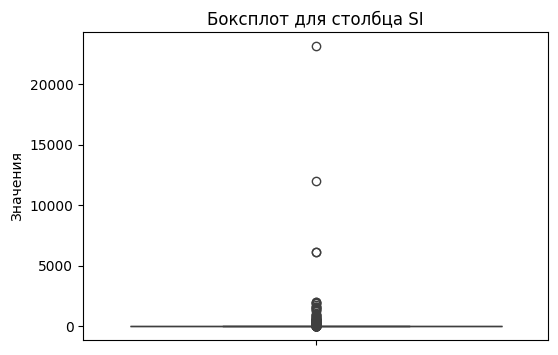

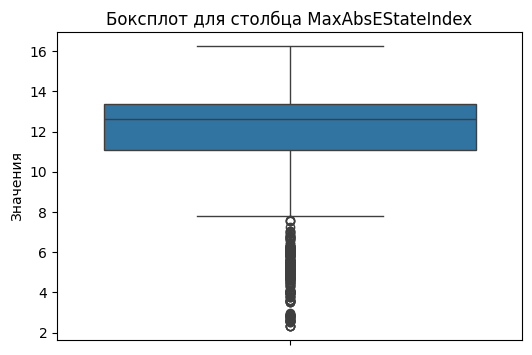

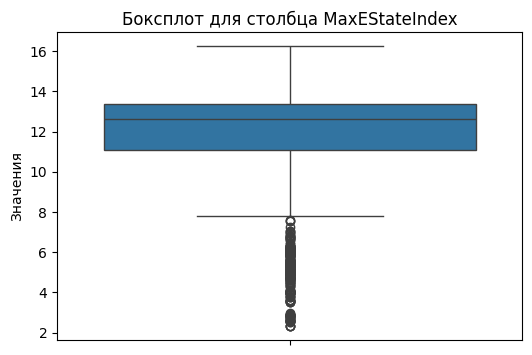

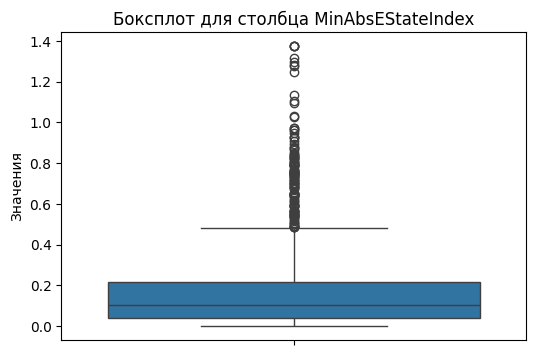

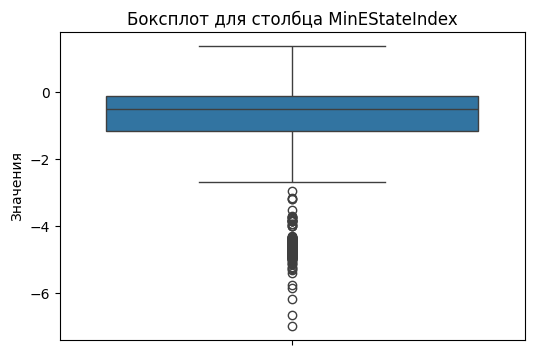

...

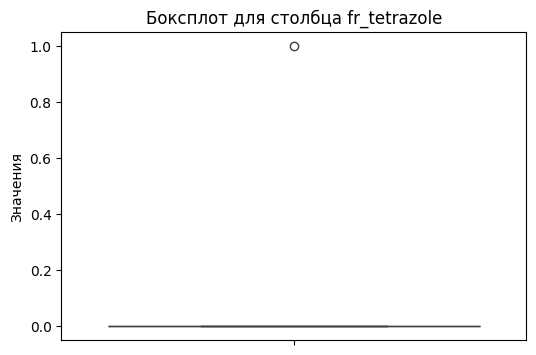

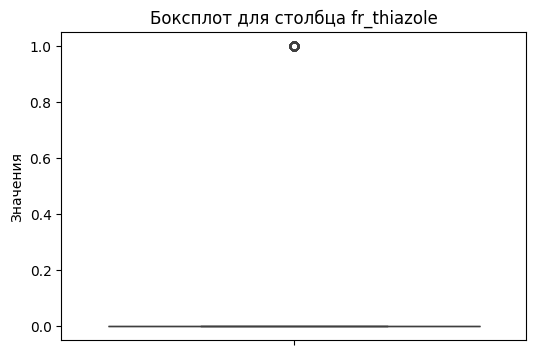

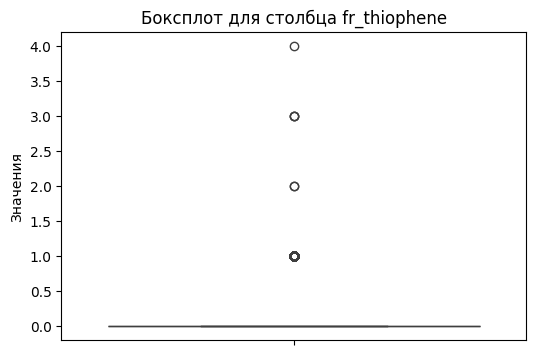

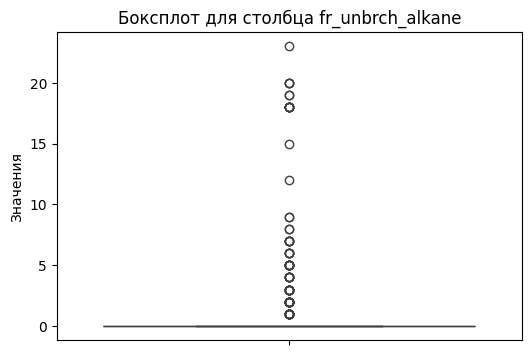

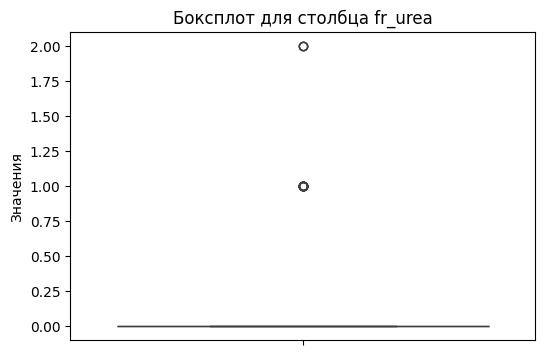

In [ ]:
for column in df:
    plt.figure(figsize = (6, 4))
    sns.boxplot(y = df[column])
    plt.title(f"Боксплот для столбца {column}")
    plt.ylabel("Значения")
    plt.show()

В некоторых столбцах весь боксплот сжимается в значение 0, но присутствуют некоторые выбросы. Посмотрим на количество выбросов и решим, что делать дальше.

In [ ]:
outliers = []
for column in df.columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    count = 0
    for value in df[column]:
        if value < lower_bound or value > upper_bound:
            count += 1
    outliers.append({'Column': column, 'Lower Bound': lower_bound, 'Upper Bound': upper_bound, 'Outliers Count': count})

for elem in outliers:
    print(elem)


{'Column': 'SI', 'Lower Bound': -20.909245463115642, 'Upper Bound': 39.28630265608629, 'Outliers Count': 264}
{'Column': 'MaxAbsEStateIndex', 'Lower Bound': 7.656427168540332, 'Upper Bound': 16.821246590032267, 'Outliers Count': 281}
{'Column': 'MaxEStateIndex', 'Lower Bound': 7.656427168540332, 'Upper Bound': 16.821246590032267, 'Outliers Count': 281}
{'Column': 'MinAbsEStateIndex', 'Lower Bound': -0.22734768410557482, 'Upper Bound': 0.48485248801436553, 'Outliers Count': 133}
{'Column': 'MinEStateIndex', 'Lower Bound': -2.7812428565176077, 'Upper Bound': 1.5051413377737628, 'Outliers Count': 214}
{'Column': 'qed', 'Lower Bound': -0.24586682113975938, 'Upper Bound': 1.3136154146940493, 'Outliers Count': 0}
{'Column': 'SPS', 'Lower Bound': -16.09114583333333, 'Upper Bound': 67.09635416666667, 'Outliers Count': 2}
{'Column': 'MolWt', 'Lower Bound': 59.09287499999965, 'Upper Bound': 691.7918750000006, 'Outliers Count': 71}
{'Column': 'HeavyAtomMolWt', 'Lower Bound': 45.01437499999963, 'U

In [ ]:
s = 1
for elem in outliers:
  if elem['Lower Bound'] == elem['Upper Bound']:
    s += 1
    print(elem['Column'], elem['Outliers Count'])
print(s)

PEOE_VSA13 358
PEOE_VSA5 375
SMR_VSA2 60
SlogP_VSA7 245
EState_VSA11 77
VSA_EState9 479
fr_Al_COO 108
fr_Al_OH 346
fr_Al_OH_noTert 240
fr_ArN 36
fr_Ar_COO 4
fr_Ar_NH 95
fr_Ar_OH 208
fr_COO 112
fr_COO2 112
fr_C_S 43
fr_HOCCN 1
fr_Imine 152
fr_NH2 144
fr_N_O 1
fr_Ndealkylation1 61
fr_Ndealkylation2 196
fr_Nhpyrrole 95
fr_aldehyde 5
fr_alkyl_carbamate 43
fr_alkyl_halide 228
fr_allylic_oxid 317
fr_amidine 44
fr_aryl_methyl 399
fr_azide 1
fr_azo 7
fr_epoxide 10
fr_ester 331
fr_furan 113
fr_guanido 37
fr_hdrzine 14
fr_hdrzone 91
fr_imidazole 123
fr_imide 54
fr_ketone 360
fr_ketone_Topliss 235
fr_lactone 71
fr_methoxy 346
fr_morpholine 61
fr_nitrile 34
fr_nitro 67
fr_nitro_arom 53
fr_nitro_arom_nonortho 51
fr_oxazole 4
fr_oxime 28
fr_para_hydroxylation 297
fr_phenol 204
fr_phenol_noOrthoHbond 204
fr_piperdine 186
fr_piperzine 94
fr_priamide 14
fr_pyridine 148
fr_quatN 36
fr_sulfide 69
fr_sulfonamd 25
fr_sulfone 11
fr_term_acetylene 2
fr_tetrazole 1
fr_thiazole 117
fr_thiophene 163
fr_unbrch_a

Получили 68 столбцов, у которых боксплот сжат в одно значение. Уберем все столбцы, у которых выбросов меньше 30 (рандомное небольшое число, учитывая общее количество элементов ~ 2000 штук).

In [ ]:
s2 = 0
rmv = []
for elem in outliers:
  if elem['Outliers Count'] <= 30 and elem['Lower Bound'] == elem['Upper Bound']:
    s2 += 1
    rmv.append(elem['Column'])
print(s2)

16


Итого, получили 16 столбцов, в которых данные "одинаковые", поэтому их можно не учитывать при построении модели.

In [ ]:
df.drop(columns = rmv, inplace=True)
df.shape

(1816, 179)

Таким образом, получилось из 210 признаков оставить 178. Теперь осталось обработать пропущенные значения и оставшиеся выбросы.

In [ ]:
for column in df.columns:
    median = df[column].median()
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[column] = df[column].apply(lambda x: median if x < lower_bound or x > upper_bound else x)


In [ ]:
missing_info = df.isna().sum()
missing_info = missing_info[missing_info > 0]
print(missing_info)

Series([], dtype: int64)


Заменили все выбросы и пустые значения на медианное значение каждого столбца.

Построим модель линейной регрессии для предсказания значения SI и оценим ее точность с помощью метрик.

In [ ]:
data = df
X = data.drop(columns=['SI'])
y = data['SI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R² Score: {r2:.4f}')
'''print('Коэффициенты модели:', model.coef_)
print('Свободный член (intercept):', model.intercept_)'''


Mean Squared Error (MSE): 58.3972
R² Score: -0.0117


"print('Коэффициенты модели:', model.coef_)\nprint('Свободный член (intercept):', model.intercept_)"

Получили Mean Squared Error (MSE): 58.3972 и R² Score: -0.0117 намного лучше, чем при первичном применении модели. Но так как R² отрицательная, то модель предсказывает данные очень плохо. Воспользуемся моделью случайного леса из 100 деревьев.

In [ ]:
data = df
X = data.drop(columns=['SI'])
y = data['SI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE): 55.8053
R² Score: 0.0332


Стало чуть-чуть получше.